# ***Breast Cancer Diagnostic***


#**IMPORT LIBRARIES**

In [95]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import sklearn.metrics as metrics
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix


#**LOAD DATASET**

In [3]:
df=pd.read_csv("/content/Breast Cancer Wisconsin (Diagnostic) -wbc.csv")


In [4]:
head=['Id',
'Outcome',
'radius_mean',
'texture_mean',
'perimeter_mean',
'area_mean',
'smoothness_mean',
'compactness_mean',
'concavity_mean',
'concave points_mean',
'symmetry_mean',
'fractal_dimension_mean',
'radius_se',
'texture_se',
'perimeter_se',
'area_se',
'smoothness_se',
'compactness_se',
'concavity_se',
'concave points_se',
'symmetry_se',
'fractal_dimension_se',
'radius_worst',
'texture_worst',
'perimeter_worst',
'area_worst',
'smoothness_worst',
'compactness_worst',
'concavity_worst',
'concave points_worst',
'symmetry_worst',
'fractal_dimension_worst'

]

In [5]:
df.columns=head

In [6]:
df

,Id,Outcome,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
1,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
2,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
3,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
4,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,15.470,23.75,103.40,741.6,0.17910,0.52490,0.5355,0.1741,0.3985,0.12440
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
563,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
564,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
565,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
566,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [7]:
df.shape

(568, 32)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568 entries, 0 to 567
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Id                       568 non-null    int64  
 1   Outcome                  568 non-null    object 
 2   radius_mean              568 non-null    float64
 3   texture_mean             568 non-null    float64
 4   perimeter_mean           568 non-null    float64
 5   area_mean                568 non-null    float64
 6   smoothness_mean          568 non-null    float64
 7   compactness_mean         568 non-null    float64
 8   concavity_mean           568 non-null    float64
 9   concave points_mean      568 non-null    float64
 10  symmetry_mean            568 non-null    float64
 11  fractal_dimension_mean   568 non-null    float64
 12  radius_se                568 non-null    float64
 13  texture_se               568 non-null    float64
 14  perimeter_se             5

#**EDA**

In [9]:
df[df.duplicated()]

,Id,Outcome,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst


In [10]:
df.isna().sum()

Id                         0
Outcome                    0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

There is no null values, duplicated values,missing values

In [11]:
df.size

18176

In [12]:
df.columns

Index(['Id', 'Outcome', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [13]:
df.describe()

,Id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,5.680000e+02,568.000000,568.000000,568.000000,568.000000,568.000000,568.000000,568.000000,568.000000,568.000000,...,568.00000,568.000000,568.000000,568.000000,568.000000,568.000000,568.000000,568.000000,568.000000,568.000000
mean,3.042382e+07,14.120491,19.305335,91.914754,654.279754,0.096321,0.104036,0.088427,0.048746,0.181055,...,16.25315,25.691919,107.125053,878.578873,0.132316,0.253541,0.271414,0.114341,0.289776,0.083884
std,1.251246e+08,3.523416,4.288506,24.285848,351.923751,0.014046,0.052355,0.079294,0.038617,0.027319,...,4.82232,6.141662,33.474687,567.846267,0.022818,0.156523,0.207989,0.065484,0.061508,0.018017
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.93000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692225e+05,11.697500,16.177500,75.135000,420.175000,0.086290,0.064815,0.029540,0.020310,0.161900,...,13.01000,21.095000,84.102500,514.975000,0.116600,0.146900,0.114475,0.064730,0.250350,0.071412
50%,9.061570e+05,13.355000,18.855000,86.210000,548.750000,0.095865,0.092525,0.061400,0.033455,0.179200,...,14.96500,25.425000,97.655000,685.550000,0.131300,0.211850,0.226550,0.099840,0.282050,0.080015
75%,8.825022e+06,15.780000,21.802500,103.875000,782.625000,0.105300,0.130400,0.129650,0.073730,0.195625,...,18.76750,29.757500,125.175000,1073.500000,0.146000,0.337600,0.381400,0.161325,0.317675,0.092065
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.04000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [14]:
df.dtypes

Id                           int64
Outcome                     object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

In [15]:
df['Outcome']=df['Outcome'].astype('category')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 568 entries, 0 to 567
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   Id                       568 non-null    int64   
 1   Outcome                  568 non-null    category
 2   radius_mean              568 non-null    float64 
 3   texture_mean             568 non-null    float64 
 4   perimeter_mean           568 non-null    float64 
 5   area_mean                568 non-null    float64 
 6   smoothness_mean          568 non-null    float64 
 7   compactness_mean         568 non-null    float64 
 8   concavity_mean           568 non-null    float64 
 9   concave points_mean      568 non-null    float64 
 10  symmetry_mean            568 non-null    float64 
 11  fractal_dimension_mean   568 non-null    float64 
 12  radius_se                568 non-null    float64 
 13  texture_se               568 non-null    float64 
 14  perimeter_

<Axes: >

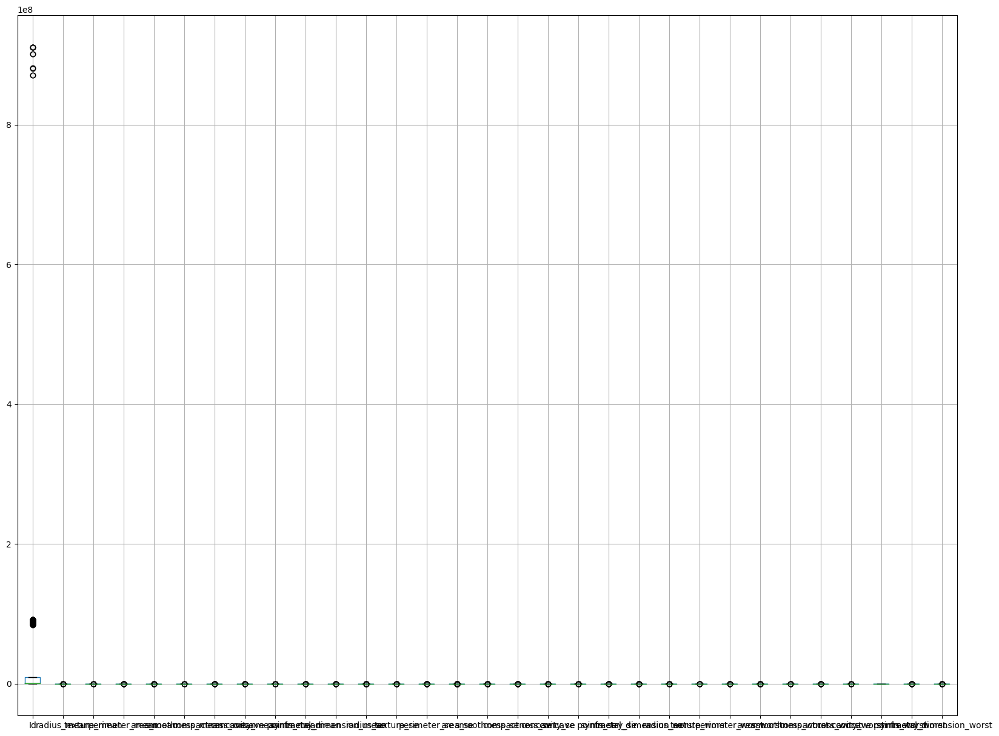

In [22]:
plt.figure(figsize=(20,15))
df.boxplot()

first row results an outlier but its an ID column, so not considered as an Outlier

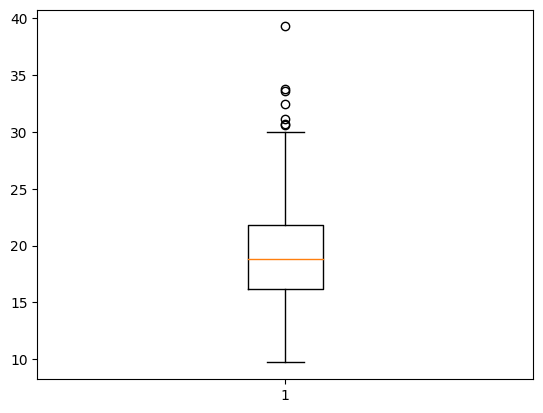

In [24]:
plt.boxplot(df['texture_mean'])
plt.show()

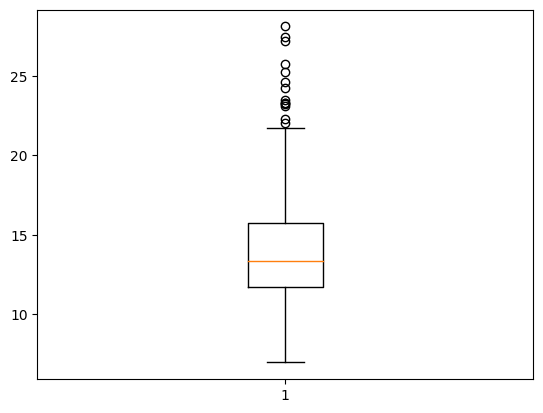

In [25]:
plt.boxplot(df['radius_mean'])
plt.show()

In [26]:
df['Outcome'].value_counts()

B    357
M    211
Name: Outcome, dtype: int64

M- malignant (cancerous)

B- benign (non-cancerous).

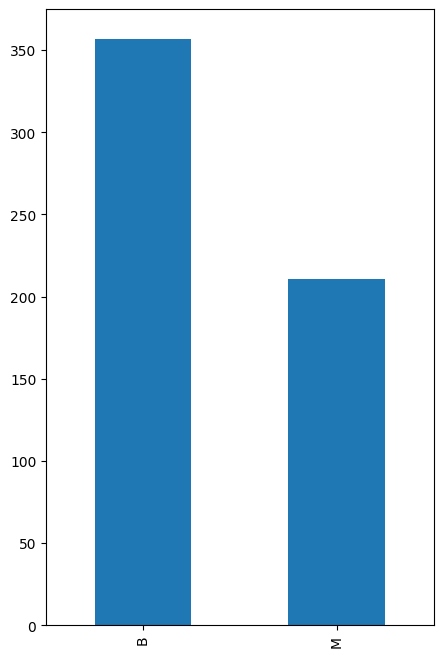

In [27]:
plt.figure(figsize=(5,8))
df['Outcome'].value_counts().plot.bar()
plt.show()

In [28]:
df["Outcome"].replace(to_replace="M", value=1, inplace=True)
df["Outcome"].replace(to_replace="B", value=0, inplace=True)
df["Outcome"].value_counts()

0    357
1    211
Name: Outcome, dtype: int64

In [29]:
df1=df.drop('Id',axis=1)

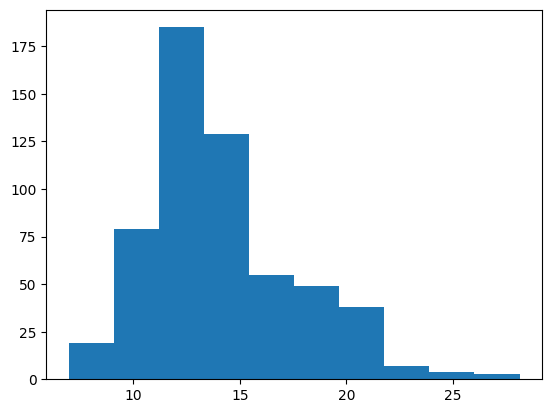

In [33]:
plt.hist(df['radius_mean'])
plt.show()

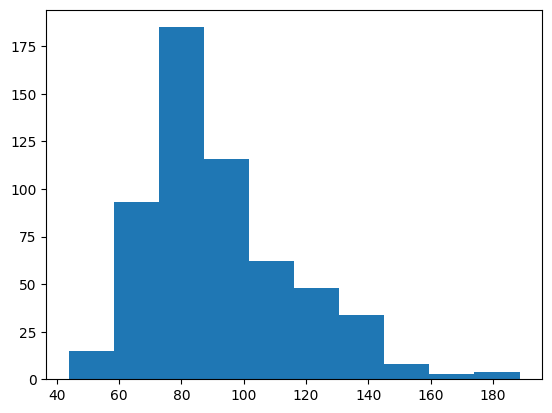

In [34]:
plt.hist(df['perimeter_mean'])
plt.show()

{'whiskers': [<matplotlib.lines.Line2D at 0x7cf1e20bfc70>,
 'caps': [<matplotlib.lines.Line2D at 0x7cf1e1ef81f0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7cf1e20bf9d0>],
 'medians': [<matplotlib.lines.Line2D at 0x7cf1e1ef8730>],
 'fliers': [<matplotlib.lines.Line2D at 0x7cf1e1ef89d0>],
 'means': []}

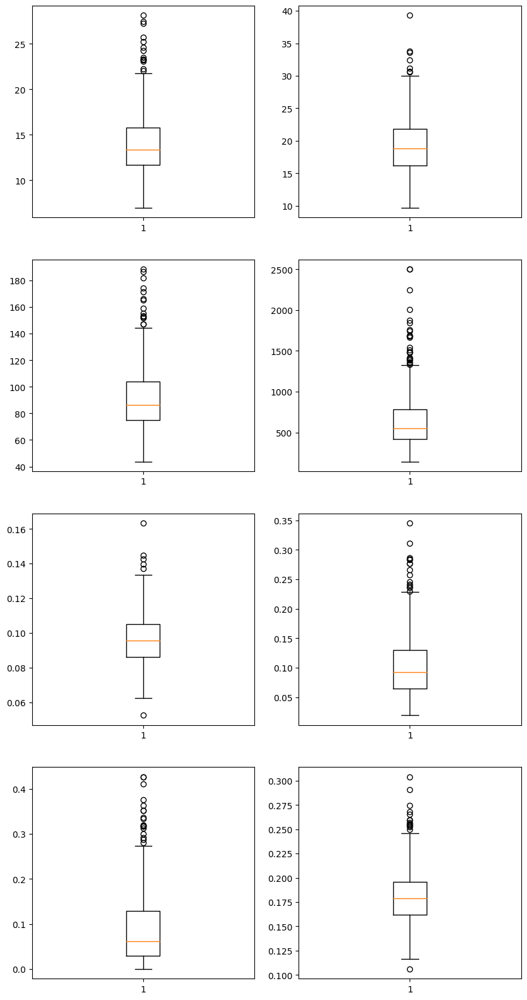

In [55]:
fig,axs=plt.subplots(4,2,figsize=(10,20))
axs[0,0].boxplot(df1.radius_mean)
axs[0,1].boxplot(df1.texture_mean)
axs[1,0].boxplot(df1.perimeter_mean)
axs[1,1].boxplot(df1.area_mean)
axs[2,0].boxplot(df1.smoothness_mean)
axs[2,1].boxplot(df1.compactness_mean)
axs[3,0].boxplot(df1.concavity_mean)
axs[3,1].boxplot(df1.symmetry_mean)

**Correlation Analysis**

In [ ]:
#Scatter plot
sns.pairplot(df1)

In [35]:
df1.corr()

<ipython-input-35-49b3fcfeb4d1>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df1.corr()


,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
radius_mean,1.000000,0.329383,0.997876,0.987344,0.168094,0.505129,0.676557,0.823165,0.144236,-0.317749,...,0.969964,0.300440,0.966231,0.941537,0.117392,0.411329,0.525454,0.744025,0.159877,0.003339
texture_mean,0.329383,1.000000,0.335918,0.326193,-0.017769,0.252038,0.315248,0.305590,0.080146,-0.068771,...,0.361964,0.912020,0.369573,0.353434,0.082714,0.290229,0.311122,0.306278,0.116263,0.127177
perimeter_mean,0.997876,0.335918,1.000000,0.986548,0.204505,0.555676,0.715662,0.851338,0.179100,-0.268103,...,0.969675,0.307013,0.971157,0.941735,0.148059,0.453304,0.562165,0.770783,0.184458,0.046909
area_mean,0.987344,0.326193,0.986548,1.000000,0.174838,0.497981,0.686232,0.824246,0.148219,-0.288560,...,0.963319,0.290565,0.960440,0.959952,0.121543,0.388554,0.511392,0.722009,0.139856,0.000382
smoothness_mean,0.168094,-0.017769,0.204505,0.174838,1.000000,0.657741,0.519002,0.551009,0.555259,0.582435,...,0.209018,0.039977,0.234093,0.202344,0.804667,0.469090,0.431727,0.500119,0.390161,0.496684
compactness_mean,0.505129,0.252038,0.555676,0.497981,0.657741,1.000000,0.881619,0.829050,0.598095,0.560161,...,0.531125,0.258877,0.585188,0.504612,0.564204,0.864097,0.815021,0.813810,0.502439,0.684961
concavity_mean,0.676557,0.315248,0.715662,0.686232,0.519002,0.881619,1.000000,0.920462,0.495525,0.329768,...,0.685826,0.308645,0.726703,0.673187,0.446155,0.751937,0.883184,0.859918,0.401782,0.510736
concave points_mean,0.823165,0.305590,0.851338,0.824246,0.551009,0.829050,0.920462,1.000000,0.457171,0.158464,...,0.829188,0.301004,0.854468,0.808120,0.450145,0.663532,0.750169,0.909272,0.368009,0.363277
symmetry_mean,0.144236,0.080146,0.179100,0.148219,0.555259,0.598095,0.495525,0.457171,1.000000,0.475301,...,0.179703,0.096533,0.212084,0.170721,0.424045,0.467830,0.429023,0.425146,0.696745,0.434165
fractal_dimension_mean,-0.317749,-0.068771,-0.268103,-0.288560,0.582435,0.560161,0.329768,0.158464,0.475301,1.000000,...,-0.263188,-0.046153,-0.216279,-0.241737,0.502760,0.453168,0.340717,0.167737,0.326735,0.765562


<ipython-input-44-464130f08e34>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_data = df1.corr()


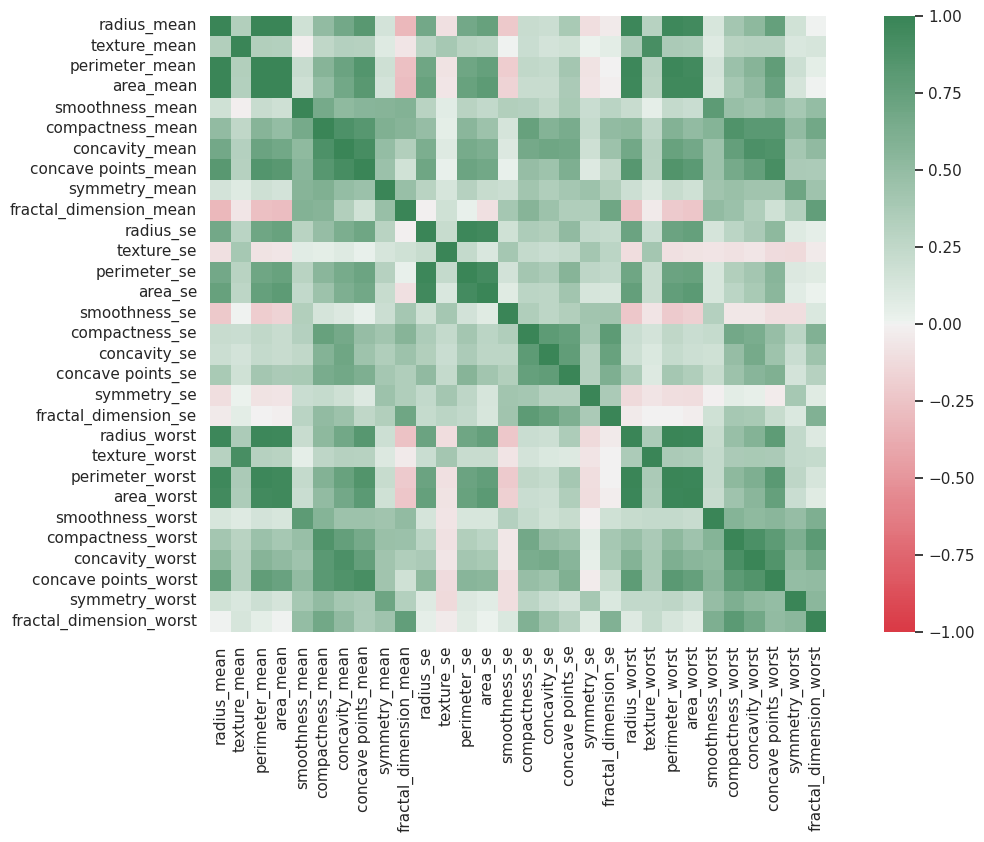

In [ ]:
#Heat Map

corr_data = df1.corr()

axis_corr = sns.heatmap(
corr_data,
vmin=-1, vmax=1, center=0,
cmap=sns.diverging_palette(10, 500, n=500),
square=True
)

plt.show()

Define Dependant variable and Independant variable

In [36]:
df1.head()

,Outcome,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
1,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
2,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
3,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
4,1,12.45,15.70,82.57,477.1,0.12780,0.17000,0.1578,0.08089,0.2087,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440


In [37]:
x=df1.iloc[:,1:]
y=df1['Outcome']

#**PREPROCESSING**


In [38]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

x= scaler.fit_transform(x)
x

array([[ 1.83208378, -0.35832707,  1.68910604, ...,  1.09526221,
        -0.24044363,  0.28529387],
       [ 1.58210603,  0.45385958,  1.56958968, ...,  1.96646779,
         1.16385786,  0.2053006 ],
       [-0.76711673,  0.25081292, -0.59077158, ...,  2.18809026,
         6.08623563,  4.95045676],
       ...,
       [ 0.70434323,  2.04789258,  0.6752776 , ...,  0.41969578,
        -1.10613122, -0.31576665],
       [ 1.84060575,  2.33962629,  1.98583632, ...,  2.30272257,
         1.93516598,  2.22846365],
       [-1.80679694,  1.22170271, -1.81313547, ..., -1.74761915,
        -0.04354852, -0.74961903]])

Split to train and test data

In [39]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=42)

# **MODEL FITTING**

# LOGISTIC REGRESSION


**Model Building, prediction,evaluation**


In [84]:
modellog = LogisticRegression()
modellog.fit(X_train, y_train)

LogisticRegression()

In [85]:
pred1= modellog.predict(X_test)

In [86]:
# Perform cross validation
score = cross_val_score(modellog, x, y, cv=10,scoring='accuracy')
score.mean()

0.9806704260651629

In [87]:
ac=accuracy_score(pred1,y_test)
ac

0.9647887323943662

In [44]:
print(classification_report(y_test,pred1))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97        87
           1       0.96      0.95      0.95        55

    accuracy                           0.96       142
   macro avg       0.96      0.96      0.96       142
weighted avg       0.96      0.96      0.96       142



In [45]:
cm1= confusion_matrix(y_test,pred1)
print(cm1)

[[85  2]
 [ 3 52]]


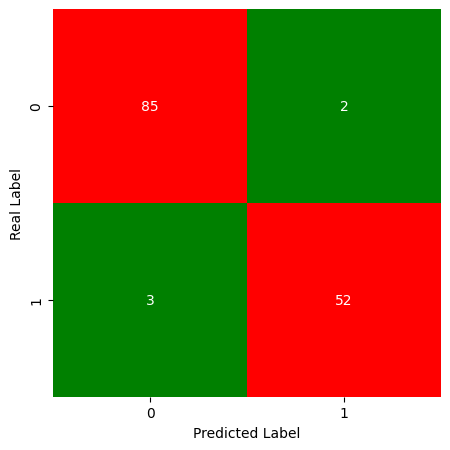

In [46]:
plt.figure(figsize=(5, 7))
colors=['Green','red']
sns.heatmap(
    cm1,
    annot=True,
    cmap=colors,
    cbar=False,
    square=True,
    fmt="d"
    )
plt.ylabel('Real Label')
plt.xlabel('Predicted Label')
plt.show()

#Regularizers

**L1 Lasso**

Reduces complexity by eliminating features that do not contribute much to the model. It penalizes features that provide little information by making them zero, eliminating the noise they produce in the model.

In [47]:
lasso = LogisticRegression(max_iter=10000, penalty="l1", solver="saga", C = 0.5)
lasso.fit(X_train, y_train)
pred2=lasso.predict(X_test)
lasso.score(X_test, y_test)

0.9577464788732394

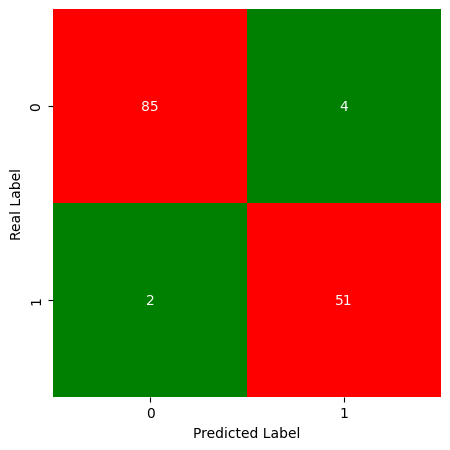

In [48]:
cm2=metrics.confusion_matrix(lasso.predict(X_test),y_test)
plt.figure(figsize=(5, 7))
colors=['Green','red']
sns.heatmap(
    cm2,
    annot=True,
    cmap=colors,
    cbar=False,
    square=True,
    fmt="d"
    )
plt.ylabel('Real Label')
plt.xlabel('Predicted Label')
plt.show()

**L2 Ridge**

Reduces complexity by decreasing the impact of certain features of our model. It penalizes irrelevant traits, but does not make them zero. It only limits the information they provide to our model.

In [49]:
ridge = LogisticRegression(max_iter=10000, penalty="l2", solver="saga", C = 0.5)
ridge.fit(X_train, y_train)
pred3=ridge.predict(X_test)
ridge.score(X_test, y_test)

0.9647887323943662

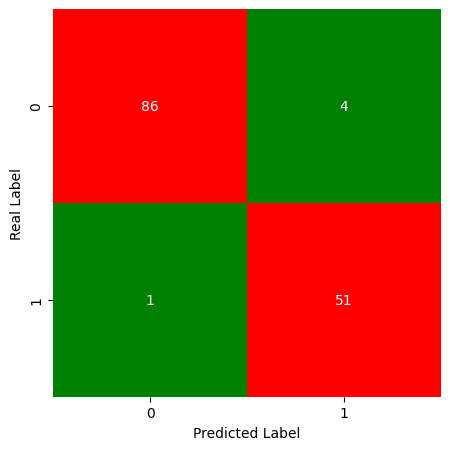

In [50]:
cm3=metrics.confusion_matrix(ridge.predict(X_test),y_test)
plt.figure(figsize=(5, 7))
colors=['Green','red']
sns.heatmap(
    cm3,
    annot=True,
    cmap=colors,
    cbar=False,
    square=True,
    fmt="d"
    )
plt.ylabel('Real Label')
plt.xlabel('Predicted Label')
plt.show()

# DECISION TREE

In [57]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import classification_report

In [59]:
model=DecisionTreeClassifier(criterion='entropy',max_depth=5)  # depth means upto 3 branch we split the data
model.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=5)

In [64]:
pred4=model.predict(X_test)
pd.Series(pred4).value_counts()

0    83
1    59
dtype: int64

In [65]:

from sklearn.metrics import accuracy_score
accuracy_score(y_test,pred4)

0.9014084507042254

# RANDOM FOREST

In [91]:
from sklearn.ensemble import RandomForestClassifier

# Build a machine learning model (Random Forest Classifier)
modelran = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
modelran.fit(X_train, y_train)

# Make predictions
pred5 = modelran.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, pred4)
conf_matrix = confusion_matrix(y_test, pred5)
report = classification_report(y_test, pred5)

print("Accuracy:", accuracy)
print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", report)



Accuracy: 0.9014084507042254
Confusion Matrix:
 [[85  2]
 [ 3 52]]
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.98      0.97        87
           1       0.96      0.95      0.95        55

    accuracy                           0.96       142
   macro avg       0.96      0.96      0.96       142
weighted avg       0.96      0.96      0.96       142



# SVM

In [51]:
from sklearn import svm
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

In [52]:
clf = SVC()
param_grid = [{'kernel':['rbf'],'gamma':[50,5,10,0.5],'C':[15,14,13,12,11,10,0.1,0.001] }]
gsv = GridSearchCV(clf,param_grid,cv=10)
gsv.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=SVC(),
             param_grid=[{'C': [15, 14, 13, 12, 11, 10, 0.1, 0.001],
                          'gamma': [50, 5, 10, 0.5], 'kernel': ['rbf']}])

In [89]:
from sklearn.svm import SVC

modelsvm = SVC(kernel='linear', C=1)
modelsvm.fit(X_train, y_train)
pred6 = modelsvm.predict(X_test)
print("Confusion Matrix:")
print(confusion_matrix(y_test, pred6))
print("\nClassification Report:")
print(classification_report(y_test, pred6))
print(f"Accuracy: {accuracy_score(y_test, pred6)}")

Confusion Matrix:
[[86  1]
 [ 4 51]]

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.99      0.97        87
           1       0.98      0.93      0.95        55

    accuracy                           0.96       142
   macro avg       0.97      0.96      0.96       142
weighted avg       0.97      0.96      0.96       142

Accuracy: 0.9647887323943662


# KNN

In [68]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier

In [69]:
num_folds=10                                 #number of folds for cross-validation
kfold=KFold(n_splits=10)                     #dataset will be divided into 10 equal-sized folds for cross-validation.
model=KNeighborsClassifier(n_neighbors=12)   #which specifies that the model will consider 12 nearest neighbors when making predictions.
result=cross_val_score(model,x,y,cv=kfold)
print(result.mean())

0.9613721804511279


In [70]:
from sklearn.model_selection import GridSearchCV
n_neighbors= np.array(range(1,40))  # set the range of neighbors, setting up a list of possible values for the n_neighbors hyperparameter that will be used in the grid search.
param_grid= dict (n_neighbors=n_neighbors)

In [71]:
model1=KNeighborsClassifier()

grid=GridSearchCV(estimator=model1, param_grid=param_grid)
grid.fit(x,y)

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39])})

In [72]:
print(grid.best_score_)
print(grid.best_params_)

0.9700667598199038
{'n_neighbors': 7}


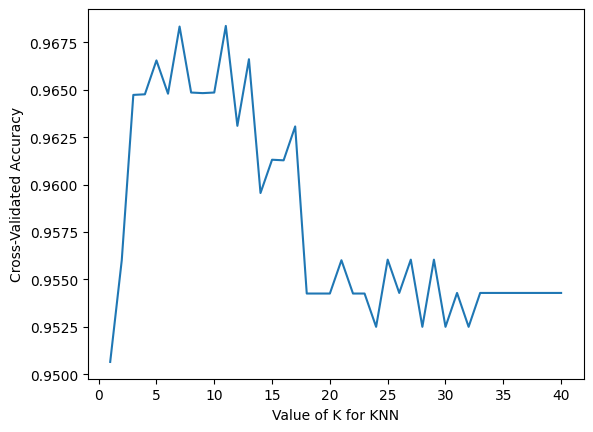

In [73]:
import matplotlib.pyplot as plt
 #%matplotlib inline

# choose k between 1 to 41
k_range = range(1, 41)
k_scores = []

# use iteration to caclulator different k in models, then return the average accuracy based on the cross validation
for k in k_range:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, x, y, cv=10)
    k_scores.append(scores.mean())

# plot to see clearly
plt.plot(k_range, k_scores)


plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated Accuracy')
plt.show()

In [74]:
# Create a KNN classifier
k =7  # Number of neighbors (you can choose a different value)
knn_classifier = KNeighborsClassifier(n_neighbors=k)

# Train the KNN classifier on the training data
knn_classifier.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = knn_classifier.predict(X_test)

# Evaluate the model's accuracy
accuracy = accuracy_score(y_test, y_pred)
accuracy

0.9577464788732394

In [75]:


print(pred1)

[1 0 1 0 0 0 0 1 1 0 1 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 0 0 1 1 0 1 1 0
 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1 0 1 1 1 0 0 1 0
 1 1 1 0 1 1 1 1 1 0 0 0 1 1 0 0 0 0 1 1 0 1 0 1 1 0 0 0 0 0 1 1 0 0 1 0 0
 1 0 0 0 0 1 1 1 0 0 1 1 0 1 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0]


Among these models (logistic, ridge, lasso, SVM, decision tree, Random forest, KNN) logistic, SVM and random forest seems to be good accurate model with same accuracy of  96% . so finalize  any of these model for prediction

# **PREDICTION**

In [79]:
newdata=pd.DataFrame({'radius_mean':28.78,
'texture_mean':21.8,
'perimeter_mean':143,
'area_mean':133.4,
'smoothness_mean':0.76,
'compactness_mean':0.65,
'concavity_mean':0.574,
'concave points_mean':0.54,
'symmetry_mean':0.548,
'fractal_dimension_mean':0.23,
'radius_se':0.002,
'texture_se':0.25,
'perimeter_se':0.254,
'area_se':0.264,
'smoothness_se':0.36,
'compactness_se':0.78,
'concavity_se':0.56,
'concave points_se':0.64,
'symmetry_se':0.75,
'fractal_dimension_se':0.7854,
'radius_worst':0.67,
'texture_worst':0.11,
'perimeter_worst':0.45,
'area_worst':0.124,
'smoothness_worst':0.57,
'compactness_worst':0.54,
'concavity_worst':0.0351,
'concave points_worst':0.45,
'symmetry_worst':0.005,
'fractal_dimension_worst':0.0001},index=[1])

In [94]:
y_pred_new1 =modellog.predict(newdata)
y_pred_new1

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


array([1])

In [93]:
y_pred_new2 =modelsvm.predict(newdata)
y_pred_new2

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but SVC was fitted without feature names
  warnings.warn(


array([1])

In [92]:
y_pred_new3 =modelran.predict(newdata)
y_pred_new3

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


array([1])